In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
#import pandas_profiling
%matplotlib inline

In [3]:
#pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
#conda install -c conda-forge pandas-profiling=2.6.0
#pip install "SomeProject"
# Fetch the library file, for example the tar.gz or whatever installable distribution you created
#with open("C:\\Users\\ShatheepR\\Desktop\\pandas-profiling-2.6.0.tar.gz","wb") as f:
#     f.write(project.get_file("C:\\Users\\ShatheepR\\Desktop\\pandas-profiling-2.6.0.tar.gz").read())
#!pip install pandas-profiling-2.6.0.tar.gz
#!conda list
#BELOW COMMAND WORKED 
#https://stackoverflow.com/questions/49314314/unable-to-import-pandas-profiling
#import sys
#!{sys.executable} -m pip install pandas-profiling

Error checking for conflicts.
Traceback (most recent call last):
  File "C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2584, in version
    return self._version
  File "C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2691, in __getattr__
    raise AttributeError(attr)
AttributeError: _version

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\pip\_internal\commands\install.py", line 503, in _warn_about_conflicts
    package_set, _dep_info = check_install_conflicts(to_install)
  File "C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\pip\_internal\operations\check.py", line 108, in check_install_conflicts
    package_set, _ = create_package_set_from_installed()
  File "C:\Prog

In [4]:
import pandas_profiling
from pandas_profiling import ProfileReport
#import io
#with io.open('C:/Users/ShatheepR/Desktop/Yield Analysis v2.csv', 'r', encoding='utf-8') as fn:
#  lines = fn.readlines()
#df = pd.DataFrame(lines)
#type(lines)

In [5]:
df = pd.read_csv('C:/Users/ShatheepR/Desktop/Yield Analysis v3.txt', sep='\t', lineterminator='\r', header=None,error_bad_lines=False)

b'Skipping line 10085: expected 55 fields, saw 57\nSkipping line 10618: expected 55 fields, saw 57\n'
b'Skipping line 335015: expected 55 fields, saw 59\n'
b'Skipping line 631770: expected 55 fields, saw 59\n'
b'Skipping line 865486: expected 55 fields, saw 59\n'
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (17,19,21,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [6]:
df.head()
#grab the first row for the header
new_header = df.iloc[0] 
#take the data less the header row
df = df[1:]
#set the header row as the df header
df.columns = new_header
df.head(2)

,QTR_YR_R,Geo Level 1,Geo Level 2,Geo Level 3,Revenue Type,Business Unit,UT Brand Level 1,UT Brand Level 2,UT Brand Level 3,UT Brand Level 4,...,REVENUE,Opp Count,Identified Pipeline,Validated Pipeline,Won Pipeline,Lost Pipeline,Identified#,Validated#,Won#,Lost#
1,\nQ12016,Asia Pacific,ASEAN Mkt,NaN,None,Systems w/TPS,Mainframe HW,System Software HW,IBM Z Operating System (26),Do Not Use - GPP IBM Z Operating System (26),...,0.28510200,1,0.00000000,0.28510200,0.00000000,0.00000000,0,1,0,0
2,\nQ12016,Asia Pacific,ASEAN Mkt,NaN,None,Systems w/TPS,Mainframe TPS,Application Development and Deployment,Enterprise Products & Compilers,Do Not Use - GPP Enterprise Products & Compilers,...,0.03000000,1,0.00000000,0.03000000,0.00000000,0.00000000,0,1,0,0


In [7]:
df.head(3)
df.columns = df.columns.str.replace(' ', '_')
df.rename(columns={"FIRTS": "FISRT", "LATS": "LAST"}, inplace = True)
df.dtypes.head()

0
QTR_YR_R        object
Geo_Level_1     object
Geo_Level_2     object
Geo_Level_3     object
Revenue_Type    object
dtype: object

In [8]:
pd.to_numeric(df['SELL_CYCLE'], errors='coerce').fillna(0)
pd.to_numeric(df['SEQUENCE'], errors='coerce').fillna(0)
pd.to_numeric(df['REVENUE'], errors='coerce').fillna(0)
pd.to_numeric(df['Opp_Count'], errors='coerce').fillna(0)
pd.to_numeric(df['Identified_Pipeline'], errors='coerce').fillna(0)
pd.to_numeric(df['Validated_Pipeline'], errors='coerce').fillna(0)
pd.to_numeric(df['Won_Pipeline'], errors='coerce').fillna(0)
pd.to_numeric(df['Lost_Pipeline'], errors='coerce').fillna(0)
pd.to_numeric(df['Identified#'], errors='coerce').fillna(0)
pd.to_numeric(df['Validated#'], errors='coerce').fillna(0)
pd.to_numeric(df['Won#'], errors='coerce').fillna(0)
pd.to_numeric(df['Lost#'], errors='coerce').fillna(0)
df.dtypes.head()

0
QTR_YR_R        object
Geo_Level_1     object
Geo_Level_2     object
Geo_Level_3     object
Revenue_Type    object
dtype: object

In [9]:
#df.astype({
#    'SELL_CYCLE': 'float',
#    'DETAIL_AGE_DAYS': 'float',
#    'REVENUE':'float', 
#    'Opp_Count':'float', 
#    'Identified_Pipeline': 'float', 
#    'Validated_Pipeline': 'float', 
#    'Won_Pipeline': 'float', 
#    'Lost_Pipeline': 'float', 
#    'Identified#': 'float', 
#    'Validated#': 'float', 
#    'Won#': 'float', 
#    'Lost#': 'float'
#        }).dtypes
#df['beer_servings'] = df.beer_servings.astype('float')
df = df.astype({'SELL_CYCLE':'float',
                'SEQUENCE':'float',
                'DETAIL_AGE_DAYS':'float',
                'QY_ROLL_COUNT':'float',
                'ROLL_OVER':'float',
                'ELAPSED_DAYS':'float',
                'REVENUE':'float',
                'Opp_Count':'float',
                'Identified_Pipeline':'float',
                'Validated_Pipeline':'float',
                'Won_Pipeline':'float',
                'Lost_Pipeline':'float',
                'Identified#':'float',
                'Validated#':'float',
                'Won#':'float',
                'Lost#':'float'
               })

In [10]:
df.dtypes #.head()
#df.info(memory_usage='deep')

0
QTR_YR_R                object
Geo_Level_1             object
Geo_Level_2             object
Geo_Level_3             object
Revenue_Type            object
Business_Unit           object
UT_Brand_Level_1        object
UT_Brand_Level_2        object
UT_Brand_Level_3        object
UT_Brand_Level_4        object
Dominant_Brand          object
Multi_Brand             object
Sales_Stage             object
WINLOSS_YR_QTR          object
FCST_YR_QTR             object
CREATE_YR_QTR           object
UPDATE_YR_QTR           object
DETAIL_AGE_DAYS        float64
Age_Group               object
SELL_CYCLE             float64
Opp_Key                 object
Opty_Dtl_Key            object
Opp_No                  object
Detail_Key              object
Opp_Source_L1           object
Opp_Source_L2           object
Opp_Source_L3           object
Owning_Org              object
BP_ID                   object
BP_COMPANY_NAME         object
Client_Segment_L1       object
Client_Segment_L2       object
Client

In [11]:
df.Geo_Level_2.unique()

array(['ASEAN Mkt', 'Australia/NZ', 'India-South Asia', 'Korea Market',
       'BeNeLux', 'CEE Mkt', 'DACH', 'France Market', 'Italy Market',
       'Nordic', 'SPGI', 'UKI', 'Greater China Market', 'Japan Market',
       'Brazil Market', 'Mexico Market', 'Spanish S. America', 'MEA Mkt',
       'Canadian Market', 'US Exception', 'US Federal Market',
       'US Market', 'UNASSIGNED', 'US Comm/CSI Market', 'US Distr Market',
       'US Fin Serv Market', 'US Indust Market', 'US Public Market',
       'US Top Market', nan], dtype=object)

In [12]:
#df_ap = df[(df.Geo_Level_2 == 'Australia/NZ') |
#       (df.Geo_Level_2 == 'ASEAN Mkt') |
#       (df.Geo_Level_2 == 'India-South Asia') |
#       (df.Geo_Level_2 == 'Korea Market')]#.head()
df_ap = df[df.Geo_Level_2.isin(['Australia/NZ', 'ASEAN Mkt', 'India-South Asia', 'Korea Market'])]
df_ap = df_ap[(df_ap.REVENUE > 0) & (df_ap.Opp_Count >0)]
#df[df_obj.columns] = df_obj.apply(lambda x: x.str.strip())
df_ap['QTR_YR_R'] = df_ap['QTR_YR_R'].str.strip()
#df_ap = df_ap[df_ap.QTR_YR_R != 'Q22020']
df_ap = df_ap[~df_ap.QTR_YR_R.isin(['Q42015', 'Q22020'])]
#df_ap.count()
#df_ap.Geo_Level_2.value_counts()
#df_ap.Won_Pipeline.astype(float).sum() 
df_ap.Won_Pipeline.sum() 
#orders.groupby('order_id').item_price.agg(['sum', 'count']).head()
#df_ap["QTR_YR_R"].unique()

2576.5044439999997

In [13]:
pd.to_numeric(df_ap.Won_Pipeline).groupby([df_ap.Geo_Level_2], sort=True).sum().sort_values(ascending=False)

Geo_Level_2
ASEAN Mkt           929.796871
India-South Asia    651.210294
Korea Market        576.707060
Australia/NZ        418.790219
Name: Won_Pipeline, dtype: float64

In [14]:
#df["QTR_YR_R"].replace({"\n": ""}, inplace=True)
df["QTR_YR_R"] = df.QTR_YR_R.replace('\n',' ', regex=True)
df_ap["QTR_YR_R"] = df_ap.QTR_YR_R.replace('\n',' ', regex=True)
df_ap["QTR_YR_R"] = df_ap.QTR_YR_R.str[2:7] + df_ap.QTR_YR_R.str[0:2]
df_ap["QTR_YR_R"].unique()

array(['2016Q1', '2017Q1', '2018Q1', '2019Q1', '2020Q1', '2016Q2',
       '2017Q2', '2018Q2', '2019Q2', '2016Q3', '2017Q3', '2018Q3',
       '2019Q3', '2016Q4', '2017Q4', '2018Q4', '2019Q4'], dtype=object)

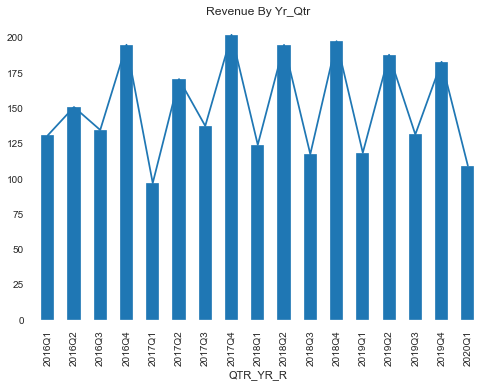

In [15]:
import matplotlib.pyplot as plot
#df_ap_grp_imt = pd.to_numeric(df_ap.Won_Pipeline).groupby([df_ap.QTR_YR_R]).sum().sort_values(ascending=False)
df_ap_grp_imt = pd.to_numeric(df_ap.Won_Pipeline).groupby([df_ap.QTR_YR_R]).sum()
df_ap_grp_imt.sort_index(axis = 0)
lines = df_ap_grp_imt.plot.line()

df_ap_grp_imt.plot.bar(x="QTR_YR_R", y="Won_Pipeline", rot=90, title="Revenue By Yr_Qtr");
plot.show(block=True);

In [16]:
df_ap.pivot_table(index='Geo_Level_2', columns='QTR_YR_R', values='Won_Pipeline', aggfunc='mean') #, margins=True

QTR_YR_R,2016Q1,2016Q2,2016Q3,2016Q4,2017Q1,2017Q2,2017Q3,2017Q4,2018Q1,2018Q2,2018Q3,2018Q4,2019Q1,2019Q2,2019Q3,2019Q4,2020Q1
Geo_Level_2,,,,,,,,,,,,,,,,,
ASEAN Mkt,0.011189,0.017769,0.012696,0.018877,0.012807,0.020571,0.018658,0.023667,0.014660,0.015764,0.010951,0.019058,0.015949,0.018313,0.012137,0.021108,0.010791
Australia/NZ,0.039878,0.019520,0.012490,0.029504,0.009671,0.036010,0.011466,0.015471,0.013710,0.043508,0.013388,0.035178,0.003791,0.027921,0.021972,0.015634,0.013002
India-South Asia,0.017558,0.018544,0.018553,0.021117,0.018195,0.014914,0.022762,0.023909,0.024118,0.023297,0.015659,0.026204,0.030622,0.028074,0.025795,0.028122,0.040154
Korea Market,0.017843,0.019169,0.017952,0.021377,0.014844,0.019832,0.018170,0.016323,0.016000,0.019010,0.015173,0.018852,0.017796,0.023910,0.012531,0.012511,0.015409


In [17]:
profile = ProfileReport(df_ap, title='Pandas Profiling Report', html={'style':{'full_width':True}})

In [18]:
#import sys
#!{sys.executable} -m pip install ipywidgets
from ipywidgets import GridspecLayout
profile.to_widgets()

In [19]:
#ipywidgets.__version__
profile.to_notebook_iframe()

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\IPython\core\display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")
